#  Object Detection in Aerial Images using DETR

## Part 3 - Inference on very large images

-----------------------------------

In this part, we will use the model that fine-tuned in Part 2 to make prediction on original very large images. To do that, we need the support of DOTA development kit that we used before in part 1. For the very large images, we will **split** it into patches, use model to **predict on each patch** and then we **merge** them into final result.

Assume that the project folder is in the following structure:

```
    |- dota-coco/
        |- annotations/
        |- train2017/
        |- val2017/
    |- DOTA_devkit/
        |- example/
            |- *.jpg
        |- ...
    |- detr/
        |- outputs/
            |- checkpoint.pth
        |- ...
    |- 3_inference-on-large-images.ipynb
```

**Note**. We have to install some package required for DOTA_devkit (check it out at Part 1)

### 1. Define helper functions and load the model

Firstly, we read the dataset to have the CLASSES array:

In [ ]:
from pycocotools.coco import COCO

ROOT = './dota-coco'
anns_path = f'{ROOT}/annotations/custom_val.json'
coco = COCO(anns_path)

categories = [cat['name'] for cat in coco.loadCats(coco.getCatIds())]
CLASSES = {}
for i in range(len(categories)):
    CLASSES[i+1] = categories[i]

loading annotations into memory...
Done (t=0.13s)
creating index...
index created!


Next, let's prepare the model and helper functions for prediction (almost of them is copied the codes from Part 2)

In [ ]:
import os
import torchvision.transforms as T
import torch
from PIL import Image

CLASSES = {}
for i in range(len(categories)):
    CLASSES[i+1] = categories[i]

device = 'cuda' if torch.cuda.is_available() else 'cpu'

# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
# from [x_c, y_c, w, h] to [xmin, ymin, xmax, ymax]
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox).cpu().detach()
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b.numpy()

def filter_bboxes_from_outputs(pil_img, outputs, threshold=0.7):
    # keep only predictions with confidence above threshold
    probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
    keep = probas.max(-1).values > threshold
    probas_to_keep = probas[keep].cpu().detach().numpy()
    # convert boxes from [0; 1] to image scales
    bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], pil_img.size)
    return probas_to_keep, bboxes_scaled

def predict_patches(img_folder, output_folder, model, threshold=0.2):
    for img_name in os.listdir(img_folder):
        pil_img = Image.open(os.path.join(img_folder, img_name))

        img = transform(pil_img).unsqueeze(0)
        img = img.to(device)
        outputs = model(img)
        probs, boxes = filter_bboxes_from_outputs(pil_img, outputs, threshold=threshold)

        output_path = os.path.join(output_folder, '.'.join(img_name.rsplit('.')[0:-1]) + '.txt')
        output_txt = ''
        if probs is not None and boxes is not None:
            for p, (x_min, y_min, x_max, y_max) in zip(probs, boxes.tolist()):
                cls = p.argmax()
                cls_name = CLASSES[cls]
                output_txt += f'{x_min} {y_min} {x_min} {y_max} {x_max} {y_max} {x_max} {y_min} {cls_name}\n'
        
        with open(output_path, 'w') as f:
            f.write(output_txt)

/home/htrvu/anaconda3/envs/htrvu/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
num_classes = len(CLASSES) + 1

model = torch.hub.load('facebookresearch/detr',
                       'detr_resnet50',
                       pretrained=False,
                       num_classes=num_classes)

checkpoint = torch.load('./detr/outputs/checkpoint.pth',
                        map_location='cpu')

model.load_state_dict(checkpoint['model'],
                      strict=False)

model = model.to(device)
model = model.eval()

### 2. Inference


We will use images in the folder `DOTA_devkit/example`. Let's copy it to a new folder `testing`.

In [ ]:
!rm -rf ./testing
!cp -r ./DOTA_devkit/example ./testing
!rm -rf ./testing/labelTxt

In [ ]:
%ls ./testing/images

P0706.png  P0770.png  P1088.png  P1234.png  P1888.png  P2598.png  P2709.png


In [ ]:
import shutil
import sys
sys.path.append('./DOTA_devkit/')
from DOTA_devkit.SplitOnlyImage import splitbase
from DOTA_devkit.ResultMerge import mergebypoly
import DOTA_devkit.dota_utils as util

def inference(root, threshold=0.4):
    '''
        the structure of folder `root`:
            |- root/
                |- images/
                    |- *.jpg
    '''
    orig_img_folder = os.path.join(root, 'images')
    img_splitted_folder = os.path.join(root, 'splitted')

    if os.path.exists(img_splitted_folder):
        shutil.rmtree(img_splitted_folder)
    os.mkdir(img_splitted_folder)

    # split images into patches
    split = splitbase(orig_img_folder, img_splitted_folder)
    split.splitdata(1)

    # predict on patches
    output_splitted_folder = os.path.join(root, 'output_splitted')
    if os.path.exists(output_splitted_folder):
        shutil.rmtree(output_splitted_folder)
    os.mkdir(output_splitted_folder)
    
    predict_patches(img_splitted_folder, output_splitted_folder, model, threshold)

    # merge patches
    tmp_folder = os.path.join(root, 'output_splitted_tmp')
    merged_folder = os.path.join(root, 'output_splitted_merged')
    final_output_folder = os.path.join(root, 'labelTxt')

    for folder in [tmp_folder, merged_folder, final_output_folder]:
        if os.path.exists(folder):
            shutil.rmtree(folder)
        os.mkdir(folder)

    util.groundtruth2Task1(os.path.join(root, 'output_splitted'), os.path.join(root, 'output_splitted_tmp'))
    mergebypoly(os.path.join(root, 'output_splitted_tmp'), os.path.join(root, 'output_splitted_merged'))
    util.Task2groundtruth_poly(os.path.join(root, 'output_splitted_merged'), os.path.join(root, 'labelTxt'))

    # remove all intermediate folders
    for folder in [img_splitted_folder, tmp_folder, merged_folder, output_splitted_folder]:
        shutil.rmtree(folder)


In [ ]:
root = './testing'
inference(root, threshold=0.4)

### 3. Visualize the result

We will use development kit to visualize the result.

**NOTE**. The DOTA development kit will **NOT** show the class name for us :D If you want to see the class name, let convert the output to COCO format (similar to Part 1) and use the code in Part 2 to visualize them.

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
from DOTA_devkit.DOTA import DOTA
import DOTA_devkit.dota_utils as util
import pylab
pylab.rcParams['figure.figsize'] = (20.0, 20.0)

In [ ]:
testing = DOTA(root)

isarralike: False
imgids: ['P0706']
filename: ./testing/images/P0706.png


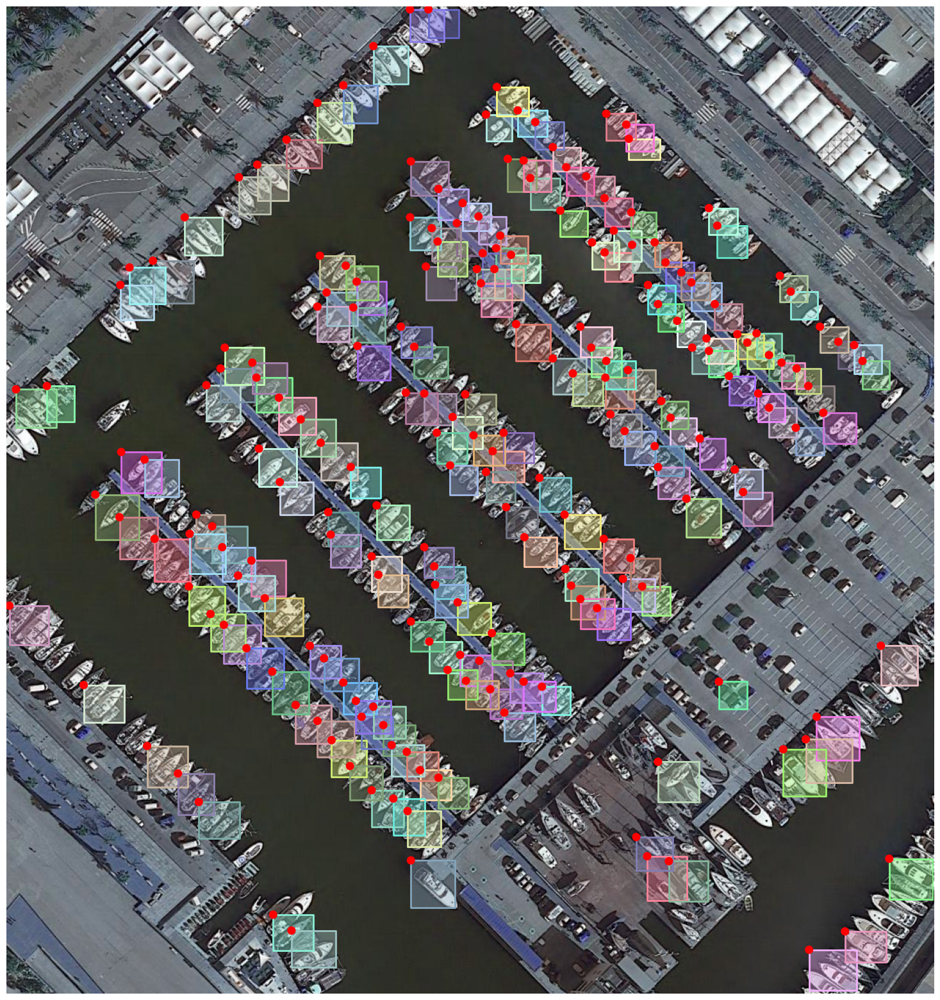

isarralike: False
imgids: ['P0770']
filename: ./testing/images/P0770.png


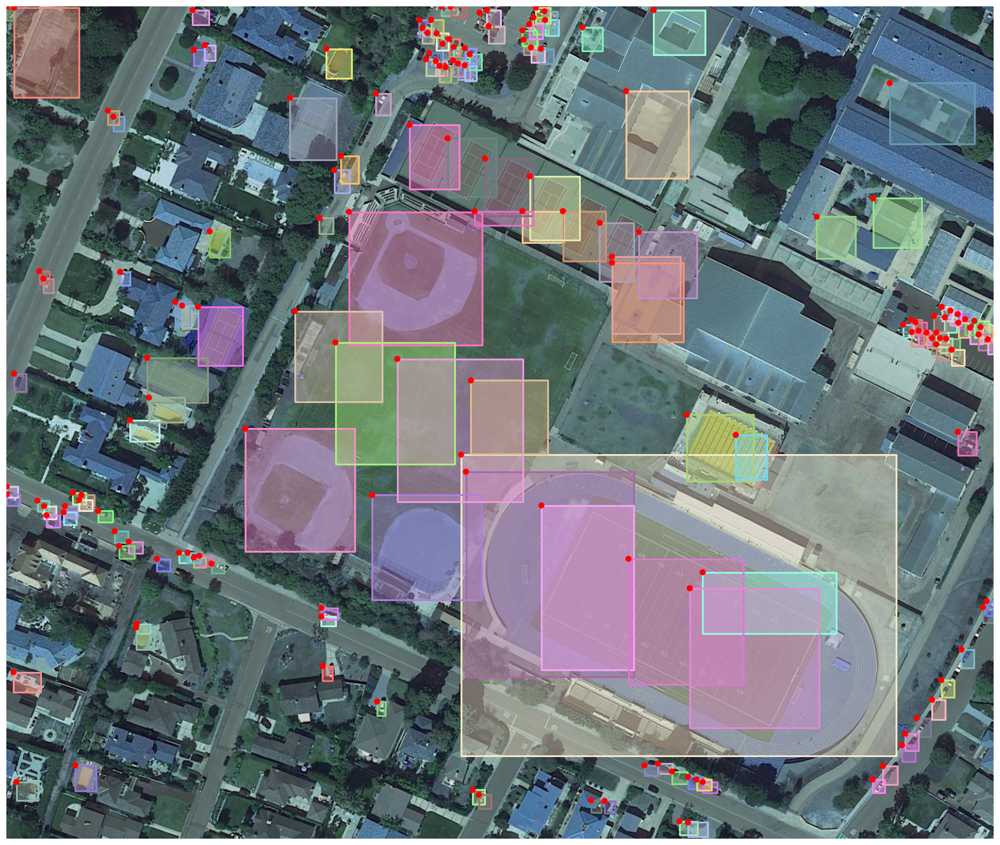

isarralike: False
imgids: ['P2598']
filename: ./testing/images/P2598.png


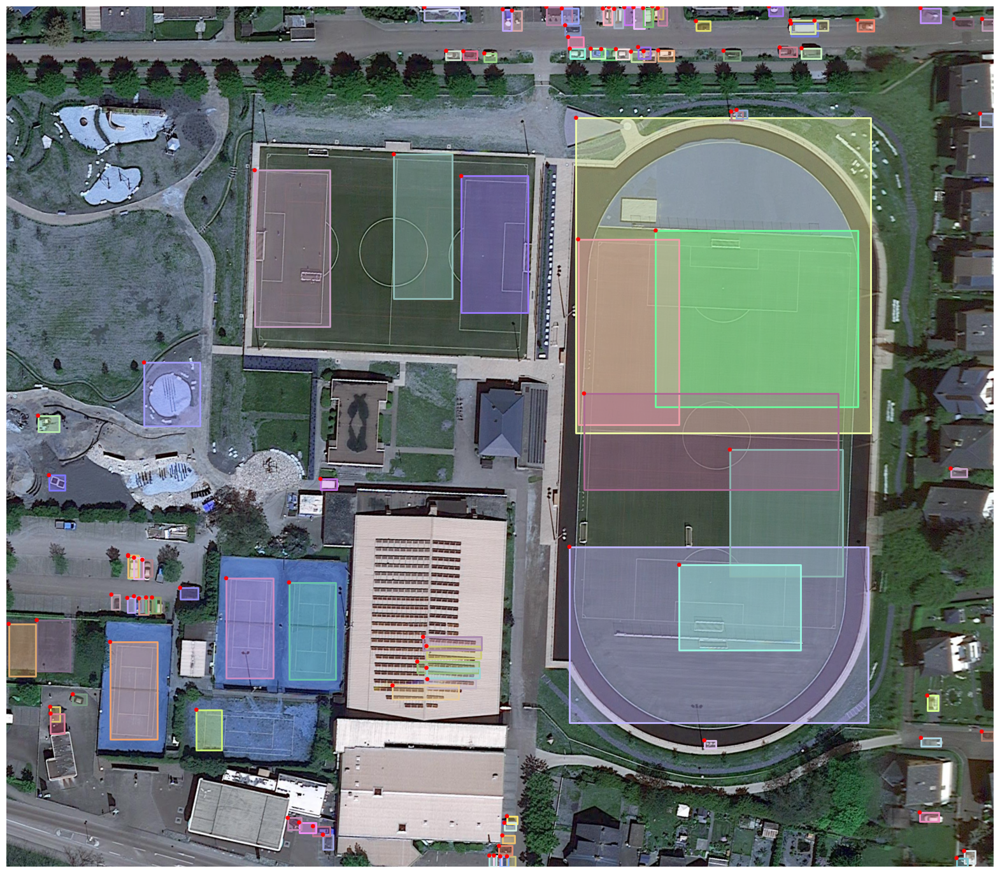

isarralike: False
imgids: ['P1234']
filename: ./testing/images/P1234.png


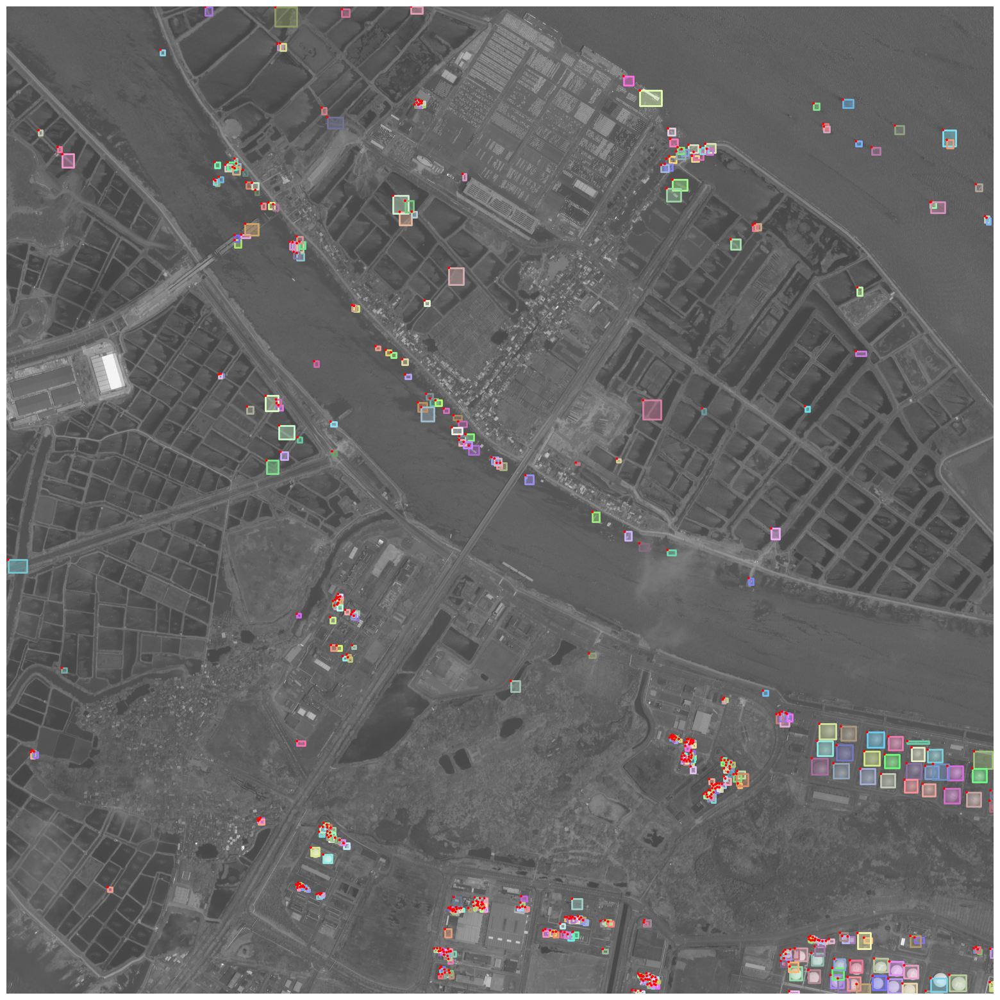

isarralike: False
imgids: ['P1088']
filename: ./testing/images/P1088.png


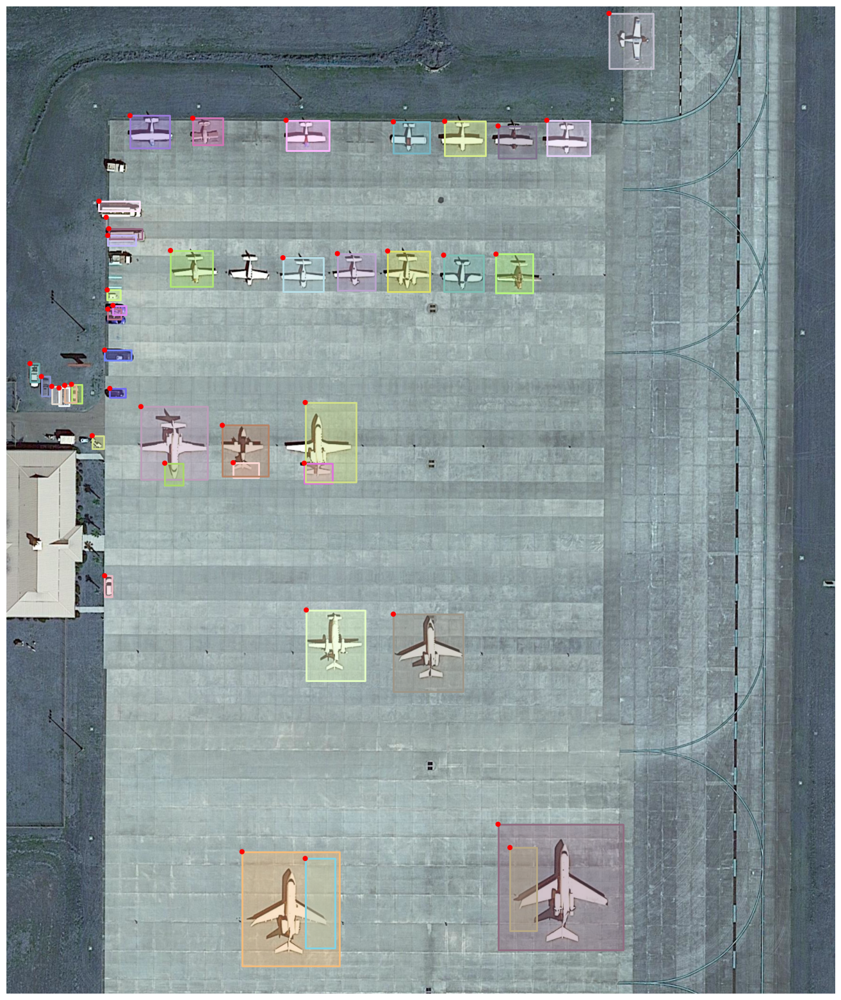

In [ ]:
imgids = testing.getImgIds()
for i in range(5):
    imgid = imgids[i]
    anns = testing.loadAnns(imgId=imgid)
    testing.showAnns(anns, imgid, 2)
    plt.show()